In [1]:
import pandas as pd
import pandana as pdna
import time

import urbanaccess as ua
from urbanaccess.config import settings
from urbanaccess.gtfsfeeds import feeds
from urbanaccess import gtfsfeeds
from urbanaccess.gtfs.gtfsfeeds_dataframe import gtfsfeeds_dfs
from urbanaccess.network import ua_network, load_network

%matplotlib inline

In [2]:
import warnings
import matplotlib.cbook
warnings.filterwarnings("ignore",category=matplotlib.cbook.mplDeprecation)

In [4]:
urbanaccess_net = ua.network.load_network(filename='final.h5')

Successfully read store: data/final.h5 with the following keys: ['/edges', '/nodes']
Successfully read store: data/final.h5 with the following keys: ['/edges', '/nodes']


In [23]:
import h5py

filename = "final.h5"

h5 = h5py.File(filename,'r')

list(h5.keys())

edges = h5['edges']
nodes = h5['nodes']

tbl1 = edges['table']
tbl1.keys()
# tbl2 = tbl1['index']
# tbl2.keys()

# tbl3 = nodes['_i_table']
# tbl4 = tbl1['index']
# tbl4.keys()

# h5.close()

AttributeError: 'Dataset' object has no attribute 'keys'

In [5]:
from google.colab import drive
drive.mount('/content/data')

Mounted at /content/data


In [4]:
validation = True
verbose = True
# bbox for Metro Vancouver
bbox = (-123.45, 48.99, -122.45, 49.49)
remove_stops_outsidebbox = True
append_definitions = True
file_path = 'C:\MDS\Capstone\DSCI_574_spat-temp-mod\DSCI_574_spat-temp-mod_students copy\lectures\Capstone_Data'

loaded_feeds = ua.gtfs.load.gtfsfeed_to_df(gtfsfeed_path=file_path,
                                           validation=validation,
                                           verbose=verbose,
                                           bbox=bbox,
                                           remove_stops_outsidebbox=remove_stops_outsidebbox,
                                           append_definitions=append_definitions)

Checking GTFS text file header whitespace... Reading files using encoding: utf-8 set in configuration.
GTFS text file header whitespace check completed. Took 0.42 seconds
--------------------------------
Processing GTFS feed: Capstone_Data
The unique agency id: translink was generated using the name of the agency in the agency.txt file.
Unique agency id operation complete. Took 0.08 seconds
Unique GTFS feed id operation complete. Took 0.01 seconds
Records:
     stop_id  stop_code                                        stop_name  \
7687    7911    57837.0  Eastbound Dewdney Trunk Rd @ 28300 Block (Flag)   
7688    7912    57838.0           Southbound 284 St @ 11900 Block (Flag)   
7689    7913    57839.0           Southbound 284 St @ 11600 Block (Flag)   
7690    7914    57840.0           Southbound 280 St @ 11400 Block (Flag)   
7691    7915    57841.0           Southbound 280 St @ 11300 Block (Flag)   
7692    7917    57843.0           Southbound 280 St @ 11100 Block (Flag)   
7693   

In [ ]:
loaded_feeds.stops.head()

,stop_id,stop_code,stop_name,stop_desc,stop_lat,stop_lon,zone_id,stop_url,location_type,parent_station,unique_agency_id,unique_feed_id,route_type,location_type_desc
0,1,50001.0,Westbound Davie St @ Bidwell St,NaN,49.286458,-123.140424,BUS ZN,NaN,0,NaN,translink,capstone_data_1,3.0,stop
1,10000,59326.0,Northbound No. 5 Rd @ McNeely Dr,NaN,49.179962,-123.091490,BUS ZN,NaN,0,NaN,translink,capstone_data_1,3.0,stop
2,10001,59324.0,Northbound No. 5 Rd @ Woodhead Rd,NaN,49.182670,-123.091448,BUS ZN,NaN,0,NaN,translink,capstone_data_1,3.0,stop
3,10002,59323.0,Southbound No. 5 Rd @ Cambie Rd,NaN,49.184252,-123.091627,BUS ZN,NaN,0,NaN,translink,capstone_data_1,3.0,stop
4,10003,59325.0,Southbound No. 5 Rd @ Woodhead Rd,NaN,49.182051,-123.091659,BUS ZN,NaN,0,NaN,translink,capstone_data_1,3.0,stop


In [ ]:
loaded_feeds.stops.unique_agency_id.unique()

array(['translink'], dtype=object)

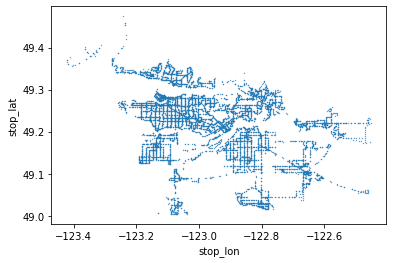

In [ ]:
loaded_feeds.stops.plot(kind='scatter', x='stop_lon', y='stop_lat', s=0.1)

In [ ]:
loaded_feeds.routes.head()

,route_id,agency_id,route_short_name,route_long_name,route_desc,route_type,route_url,route_color,route_text_color,unique_agency_id,unique_feed_id,route_type_desc
0,10232,TL,256,Whitby Estate/Park Royal/Spuraway,NaN,3,NaN,NaN,NaN,translink,capstone_data_1,Bus
1,11201,TL,033,29th Avenue Station/UBC,NaN,3,NaN,NaN,NaN,translink,capstone_data_1,Bus
2,11202,TL,042,Alma/Spanish Banks,NaN,3,NaN,NaN,NaN,translink,capstone_data_1,Bus
3,11692,TL,364,Langley Centre/Scottsdale Exchange,NaN,3,NaN,NaN,NaN,translink,capstone_data_1,Bus
4,11693,TL,388,22nd St Station/Carvolth Exchange,NaN,3,NaN,NaN,NaN,translink,capstone_data_1,Bus


In [ ]:
loaded_feeds.stop_times.head()

,trip_id,arrival_time,departure_time,stop_id,stop_sequence,stop_headsign,pickup_type,drop_off_type,shape_dist_traveled,unique_agency_id,unique_feed_id,route_type,pickup_type_desc,drop_off_type_desc,departure_time_sec
0,12495566,16:01:00,16:01:00,646,1,NaN,0,0,NaN,translink,capstone_data_1,3,Regularly Scheduled,Regularly Scheduled,57660
1,12495566,16:13:54,16:13:54,1277,10,NaN,0,0,3.4113,translink,capstone_data_1,3,Regularly Scheduled,Regularly Scheduled,58434
2,12495566,16:15:24,16:15:24,1279,11,NaN,0,0,3.8103,translink,capstone_data_1,3,Regularly Scheduled,Regularly Scheduled,58524
3,12495566,16:17:30,16:17:30,56,12,NaN,0,0,4.3659,translink,capstone_data_1,3,Regularly Scheduled,Regularly Scheduled,58650
4,12495566,16:18:25,16:18:25,12619,13,NaN,0,0,4.6100,translink,capstone_data_1,3,Regularly Scheduled,Regularly Scheduled,58705


In [ ]:
loaded_feeds.trips.head()

,route_id,service_id,trip_id,trip_headsign,trip_short_name,direction_id,block_id,shape_id,wheelchair_accessible,bikes_allowed,unique_agency_id,unique_feed_id,bikes_allowed_desc,wheelchair_accessible_desc
0,6612,101,12495566,2 DOWNTOWN,NaN,0,1991501,263376,0,0,translink,capstone_data_1,None,None
1,6612,1,12495567,2 DOWNTOWN,NaN,0,1991504,263375,0,0,translink,capstone_data_1,None,None
2,6612,1,12495568,2 DOWNTOWN,NaN,0,1991523,263375,0,0,translink,capstone_data_1,None,None
3,6612,1,12495569,2 DOWNTOWN,NaN,0,1991515,263375,0,0,translink,capstone_data_1,None,None
4,6612,1,12495570,2 DOWNTOWN,NaN,0,1991516,263375,0,0,translink,capstone_data_1,None,None


In [ ]:
loaded_feeds.calendar.head()

,service_id,monday,tuesday,wednesday,thursday,friday,saturday,sunday,start_date,end_date,unique_agency_id,unique_feed_id
0,1,1,1,1,1,1,0,0,20210412,20210620,translink,capstone_data_1
1,101,0,0,0,0,0,0,0,20210412,20210620,translink,capstone_data_1
2,1101,0,0,0,0,0,0,0,20210412,20210620,translink,capstone_data_1
3,1201,0,0,0,0,0,0,0,20210412,20210620,translink,capstone_data_1
4,152201,0,0,0,0,0,0,0,20210412,20210620,translink,capstone_data_1


In [ ]:
ua.gtfs.network.create_transit_net(gtfsfeeds_dfs=loaded_feeds,
                                   day='monday',
                                   timerange=['07:00:00', '10:00:00'],
                                   calendar_dates_lookup=None)

Using calendar to extract service_ids to select trips.
1 service_ids were extracted from calendar
23,707 trip(s) 38.82 percent of 61,073 total trip records were found in calendar for GTFS feed(s): ['capstone data']
NOTE: If you expected more trips to have been extracted and your GTFS feed(s) have a calendar_dates file, consider utilizing the calendar_dates_lookup parameter in order to add additional trips based on information inside of calendar_dates. This should only be done if you know the corresponding GTFS feed is using calendar_dates instead of calendar to specify service_ids. When in doubt do not use the calendar_dates_lookup parameter.
23,707 of 61,073 total trips were extracted representing calendar day: monday. Took 0.10 seconds
There are no departure time records missing from trips following the specified schedule. There are no records to interpolate.
Difference between stop times has been successfully calculated. Took 6.00 seconds
Stop times from 07:00:00 to 10:00:00 success

In [ ]:
urbanaccess_net = ua.network.ua_network

In [ ]:
urbanaccess_net.transit_edges.head()

,node_id_from,node_id_to,weight,unique_agency_id,unique_trip_id,sequence,id,route_type,unique_route_id,net_type
0,55_translink,56_translink,1.283333,translink,12495573_translink,1,12495573_translink_1,3,6612_translink,transit
1,56_translink,12619_translink,1.016667,translink,12495573_translink,2,12495573_translink_2,3,6612_translink,transit
2,12619_translink,58_translink,0.666667,translink,12495573_translink,3,12495573_translink_3,3,6612_translink,transit
3,58_translink,60_translink,1.216667,translink,12495573_translink,4,12495573_translink_4,3,6612_translink,transit
4,60_translink,61_translink,0.750000,translink,12495573_translink,5,12495573_translink_5,3,6612_translink,transit


In [ ]:
urbanaccess_net.transit_nodes.head()

,x,y,unique_agency_id,route_type,stop_id,stop_name,parent_station,stop_code,zone_id,location_type,net_type
node_id,,,,,,,,,,,
1_translink,-123.140424,49.286458,translink,3.0,1,Westbound Davie St @ Bidwell St,NaN,50001.0,BUS ZN,0,transit
10000_translink,-123.091490,49.179962,translink,3.0,10000,Northbound No. 5 Rd @ McNeely Dr,NaN,59326.0,BUS ZN,0,transit
10001_translink,-123.091448,49.182670,translink,3.0,10001,Northbound No. 5 Rd @ Woodhead Rd,NaN,59324.0,BUS ZN,0,transit
10002_translink,-123.091627,49.184252,translink,3.0,10002,Southbound No. 5 Rd @ Cambie Rd,NaN,59323.0,BUS ZN,0,transit
10003_translink,-123.091659,49.182051,translink,3.0,10003,Southbound No. 5 Rd @ Woodhead Rd,NaN,59325.0,BUS ZN,0,transit


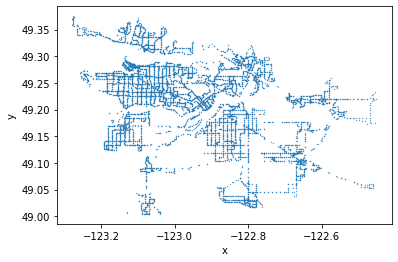

In [ ]:
urbanaccess_net.transit_nodes.plot(kind='scatter', x='x', y='y', s=0.1)

# **OSM pedestrian street network data to produce a graph network of nodes and edges**

same bounding box

In [ ]:
nodes, edges = ua.osm.load.ua_network_from_bbox(bbox=bbox,
                                                remove_lcn=True)

Requesting network data within bounding box from Overpass API in 4 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](48.99000000,-123.45000000,49.24108702,-122.94974726);>;);out;'}"
Downloaded 18,745.4KB from www.overpass-api.de in 3.43 seconds
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](49.24022154,-123.45000000,49.49108053,-122.94949183);>;);out;'}"
Downloaded 32,258.8KB from www.overpass-api.de in 5.55 seconds
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedes

# **Create a pedestrian network**

In [ ]:
ua.osm.network.create_osm_net(osm_edges=edges,
                              osm_nodes=nodes,
                              travel_speed_mph=3)

Created OSM network with travel time impedance using a travel speed of 3 MPH. Took 0.03 seconds


In [ ]:
urbanaccess_net.osm_nodes.head()

,x,y,id,net_type
id,,,,
24657785,-122.756605,49.162852,24657785,walk
24657870,-122.845696,49.162805,24657870,walk
24658086,-122.790872,49.162807,24658086,walk
24658104,-122.794348,49.162810,24658104,walk
24658113,-122.796734,49.162885,24658113,walk


In [ ]:
urbanaccess_net.osm_edges.head()

from          to  ...    weight net_type
7635734646 264765135   7635734646   264765135  ...  0.644700     walk
264765135  7635734646   264765135  7635734646  ...  0.644700     walk
           5987979738   264765135  5987979738  ...  0.214539     walk
5987979738 264765135   5987979738   264765135  ...  0.214539     walk
           5987979740  5987979738  5987979740  ...  0.381955     walk

[5 rows x 22 columns]

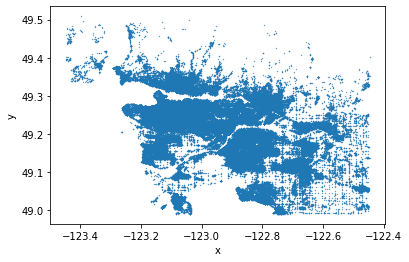

In [ ]:
urbanaccess_net.osm_nodes.plot(kind='scatter', x='x', y='y', s=0.1)

# **Create an integrated transit and pedestrian network**

In [ ]:
ua.network.integrate_network(urbanaccess_network=urbanaccess_net,
                             headways=False)

Loaded UrbanAccess network components comprised of:
     Transit: 8,429 nodes and 131,461 edges;
     OSM: 227,476 nodes and 699,472 edges
Connector edges between the OSM and transit network nodes successfully completed. Took 3.52 seconds
Edge and node tables formatted for Pandana with integer node ids: id_int, to_int, and from_int. Took 10.49 seconds
Network edge and node network integration completed successfully resulting in a total of 235,905 nodes and 847,791 edges:
     Transit: 8,429 nodes 131,461 edges;
     OSM: 227,476 nodes 699,472 edges; and
     OSM/Transit connector: 16,858 edges.


In [ ]:
urbanaccess_net.net_nodes.head()

,id,x,y,unique_agency_id,route_type,stop_id,stop_name,parent_station,stop_code,zone_id,location_type,net_type
id_int,,,,,,,,,,,,
1,1_translink,-123.140424,49.286458,translink,3.0,1,Westbound Davie St @ Bidwell St,NaN,50001.0,BUS ZN,0.0,transit
2,10000_translink,-123.091490,49.179962,translink,3.0,10000,Northbound No. 5 Rd @ McNeely Dr,NaN,59326.0,BUS ZN,0.0,transit
3,10001_translink,-123.091448,49.182670,translink,3.0,10001,Northbound No. 5 Rd @ Woodhead Rd,NaN,59324.0,BUS ZN,0.0,transit
4,10002_translink,-123.091627,49.184252,translink,3.0,10002,Southbound No. 5 Rd @ Cambie Rd,NaN,59323.0,BUS ZN,0.0,transit
5,10003_translink,-123.091659,49.182051,translink,3.0,10003,Southbound No. 5 Rd @ Woodhead Rd,NaN,59325.0,BUS ZN,0.0,transit


In [ ]:
urbanaccess_net.net_edges.head()

,from,to,weight,unique_agency_id,unique_trip_id,sequence,edge_id,route_type,unique_route_id,net_type,distance,name,ref,highway,service,bridge,tunnel,access,oneway,toll,lanes,maxspeed,hgv,hov,area,width,est_width,junction,from_int,to_int
0,55_translink,56_translink,1.283333,translink,12495573_translink,1.0,12495573_translink_1,3.0,6612_translink,transit,NaN,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,5291,5388
1,56_translink,12619_translink,1.016667,translink,12495573_translink,2.0,12495573_translink_2,3.0,6612_translink,transit,NaN,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,5388,1784
2,12619_translink,58_translink,0.666667,translink,12495573_translink,3.0,12495573_translink_3,3.0,6612_translink,transit,NaN,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,1784,5592
3,58_translink,60_translink,1.216667,translink,12495573_translink,4.0,12495573_translink_4,3.0,6612_translink,transit,NaN,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,5592,5777
4,60_translink,61_translink,0.750000,translink,12495573_translink,5.0,12495573_translink_5,3.0,6612_translink,transit,NaN,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,5777,5873


In [ ]:
urbanaccess_net.net_edges[urbanaccess_net.net_edges['net_type'] == 'transit'].head()

,from,to,weight,unique_agency_id,unique_trip_id,sequence,edge_id,route_type,unique_route_id,net_type,distance,name,ref,highway,service,bridge,tunnel,access,oneway,toll,lanes,maxspeed,hgv,hov,area,width,est_width,junction,from_int,to_int
0,55_translink,56_translink,1.283333,translink,12495573_translink,1.0,12495573_translink_1,3.0,6612_translink,transit,NaN,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,5291,5388
1,56_translink,12619_translink,1.016667,translink,12495573_translink,2.0,12495573_translink_2,3.0,6612_translink,transit,NaN,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,5388,1784
2,12619_translink,58_translink,0.666667,translink,12495573_translink,3.0,12495573_translink_3,3.0,6612_translink,transit,NaN,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,1784,5592
3,58_translink,60_translink,1.216667,translink,12495573_translink,4.0,12495573_translink_4,3.0,6612_translink,transit,NaN,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,5592,5777
4,60_translink,61_translink,0.750000,translink,12495573_translink,5.0,12495573_translink_5,3.0,6612_translink,transit,NaN,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,5777,5873


Save the network

In [ ]:
urbanaccess_net.net_edges.to_csv('net_edges.csv', index=False)
urbanaccess_net.net_nodes.to_csv('net_nodes.csv', index=False)

In [ ]:
ua.network.save_network(urbanaccess_network=urbanaccess_net,
                        filename='final.h5', dir='/content/data/MyDrive/Capstone_Data',
                        overwrite_key = True)

New final.h5 hdf5 store created in dir: /content/data/MyDrive/Capstone_Data
edges saved in /content/data/MyDrive/Capstone_Data/final.h5 hdf5 store.
Using existing /content/data/MyDrive/Capstone_Data/final.h5 hdf5 store.
nodes saved in /content/data/MyDrive/Capstone_Data/final.h5 hdf5 store.


In [5]:
urbanaccess_net = ua.network.load_network(dir='C:\MDS\Capstone\DSCI_574_spat-temp-mod\DSCI_574_spat-temp-mod_students copy\lectures\Capstone_Data', filename='final.h5')

Successfully read store: C:\MDS\Capstone\DSCI_574_spat-temp-mod\DSCI_574_spat-temp-mod_students copy\lectures\Capstone_Data/final.h5 with the following keys: ['/edges', '/nodes']
Successfully read store: C:\MDS\Capstone\DSCI_574_spat-temp-mod\DSCI_574_spat-temp-mod_students copy\lectures\Capstone_Data/final.h5 with the following keys: ['/edges', '/nodes']


# **Visualize**

Figure created. Took 110.45 seconds


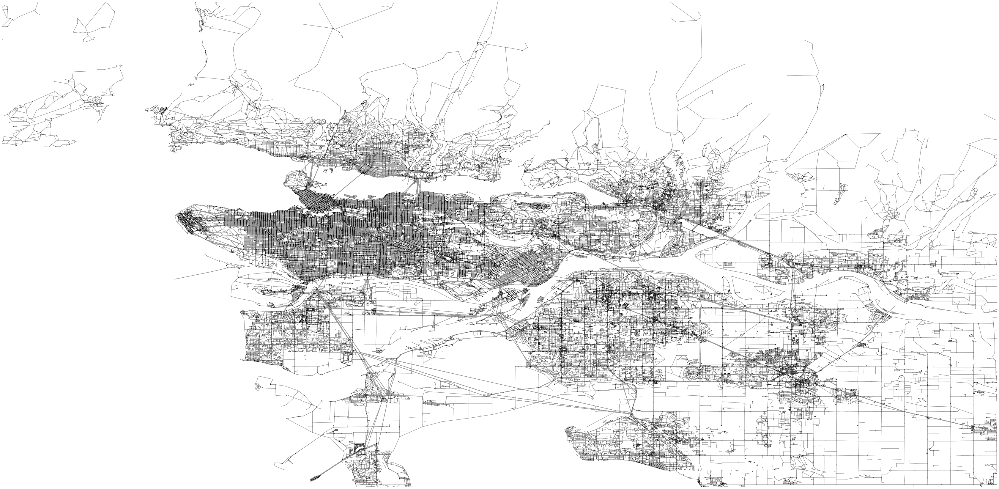

(<Figure size 4320x2160 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f19a250c810>)

In [ ]:
ua.plot.plot_net(nodes=urbanaccess_net.net_nodes,
                 edges=urbanaccess_net.net_edges,
                 bbox=bbox,
                 fig_height=30, margin=0.02,
                 edge_color='#999999', edge_linewidth=1, edge_alpha=1,
                 node_color='black', node_size=1.1, node_alpha=1, node_edgecolor='none', node_zorder=3, nodes_only=False)

# **By travel time**

Figure created. Took 109.57 seconds


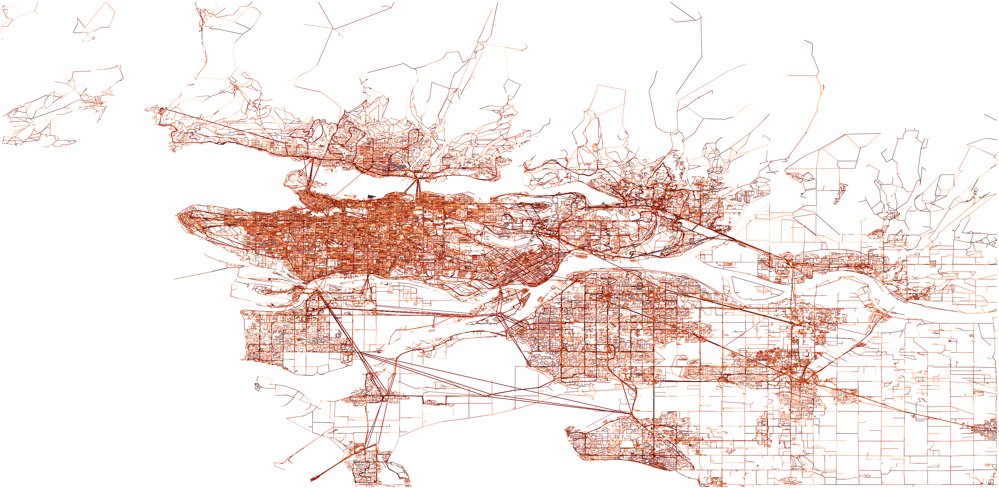

(<Figure size 4320x2160 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f19482d3e50>)

In [ ]:
edgecolor = ua.plot.col_colors(df=urbanaccess_net.net_edges, col='weight', cmap='gist_heat_r', num_bins=5)
ua.plot.plot_net(nodes=urbanaccess_net.net_nodes,
                 edges=urbanaccess_net.net_edges,
                 bbox=bbox,
                 fig_height=30, margin=0.02,
                 edge_color=edgecolor, edge_linewidth=1, edge_alpha=0.7,
                 node_color='black', node_size=0, node_alpha=1, node_edgecolor='none', node_zorder=3, nodes_only=False)

Figure created. Took 15.79 seconds


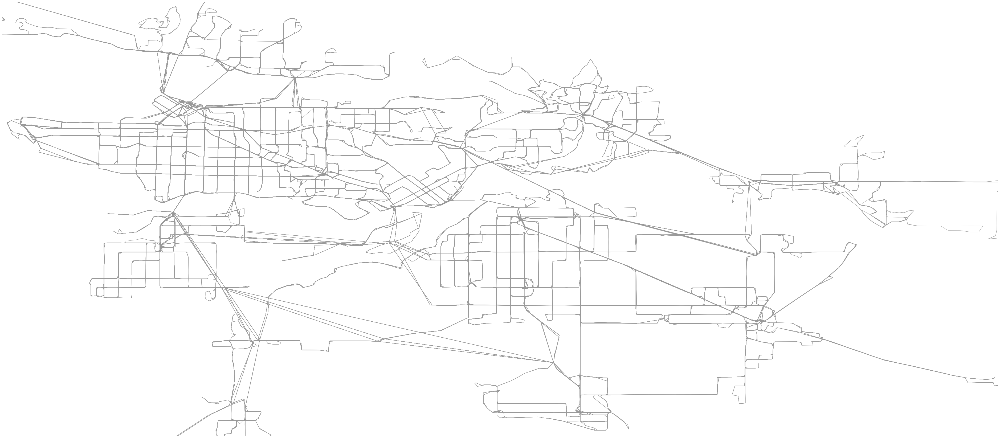

(<Figure size 4826.7x2160 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f190bd00090>)

In [ ]:
# transit network
ua.plot.plot_net(nodes=urbanaccess_net.net_nodes,
                 edges=urbanaccess_net.net_edges[urbanaccess_net.net_edges['net_type']=='transit'],
                 bbox=None,
                 fig_height=30, margin=0.02,
                 edge_color='#999999', edge_linewidth=1, edge_alpha=1,
                 node_color='black', node_size=0, node_alpha=1, node_edgecolor='none', node_zorder=3, nodes_only=False)

Figure created. Took 87.39 seconds


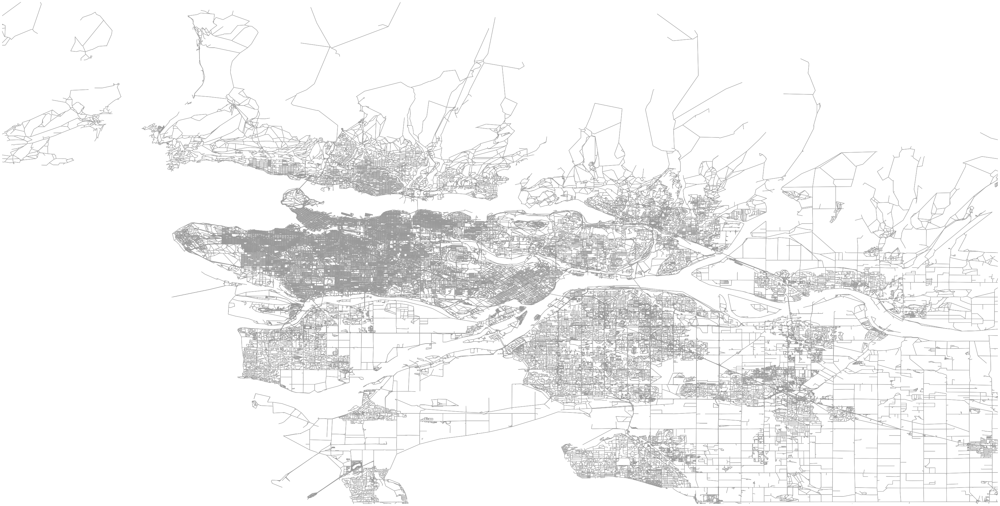

(<Figure size 4172.42x2160 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f195fc17d10>)

In [ ]:
# pedestrian network
ua.plot.plot_net(nodes=urbanaccess_net.net_nodes,
                 edges=urbanaccess_net.net_edges[urbanaccess_net.net_edges['net_type']=='walk'],
                 bbox=None,
                 fig_height=30, margin=0.02,
                 edge_color='#999999', edge_linewidth=1, edge_alpha=1,
                 node_color='black', node_size=0, node_alpha=1, node_edgecolor='none', node_zorder=3, nodes_only=False)

# **Add average headways to network travel time**
calculate route stop level headways

In [ ]:
ua.gtfs.headways.headways(gtfsfeeds_df=loaded_feeds,
                          headway_timerange=['07:00:00','10:00:00'])

Stop times from 07:00:00 to 10:00:00 successfully selected 136,816 records out of 703,203 total records (19.46 percent of total). Took 0.06 seconds
Starting route stop headway calculation for 12,158 route stops...
Route stop headway calculation complete. Took 32.69 seconds
headway calculation complete. Took 34.51 seconds


In [ ]:
loaded_feeds.headways.head()

,count,mean,std,min,25%,50%,75%,max,unique_stop_id,unique_route_id,node_id_route
111830,5.0,31.923333,3.155058,29.0,30.0,30.0,34.616667,36.0,10000_translink,6829_translink,10000_translink_6829_translink
111854,5.0,31.923333,3.155058,29.0,30.0,30.0,34.616667,36.0,10000_translink,6829_translink,10000_translink_6829_translink
111884,5.0,31.923333,3.155058,29.0,30.0,30.0,34.616667,36.0,10000_translink,6829_translink,10000_translink_6829_translink
111914,5.0,31.923333,3.155058,29.0,30.0,30.0,34.616667,36.0,10000_translink,6829_translink,10000_translink_6829_translink
111944,5.0,31.923333,3.155058,29.0,30.0,30.0,34.616667,36.0,10000_translink,6829_translink,10000_translink_6829_translink


Add the route stop level average headways to integrated network

In [ ]:
ua.network.integrate_network(urbanaccess_network=urbanaccess_net,
                             headways=True,
                             urbanaccess_gtfsfeeds_df=loaded_feeds,
                             headway_statistic='mean')

Loaded UrbanAccess network components comprised of:
     Transit: 8,429 nodes and 131,461 edges;
     OSM: 227,476 nodes and 699,472 edges
routes successfully joined to transit nodes. Took 0.23 seconds
Connector edges between the OSM and transit network nodes successfully completed. Took 4.37 seconds
mean route stop headway will be used for pedestrian to transit edge impedance.
Headway impedance calculation completed. Took 0.11 seconds
Edge and node tables formatted for Pandana with integer node ids: id_int, to_int, and from_int. Took 12.00 seconds
Network edge and node network integration completed successfully resulting in a total of 239,634 nodes and 979,907 edges:
     Transit: 12,158 nodes 131,461 edges;
     OSM: 227,476 nodes 699,472 edges; and
     OSM/Transit connector: 148,974 edges.


Figure created. Took 130.07 seconds


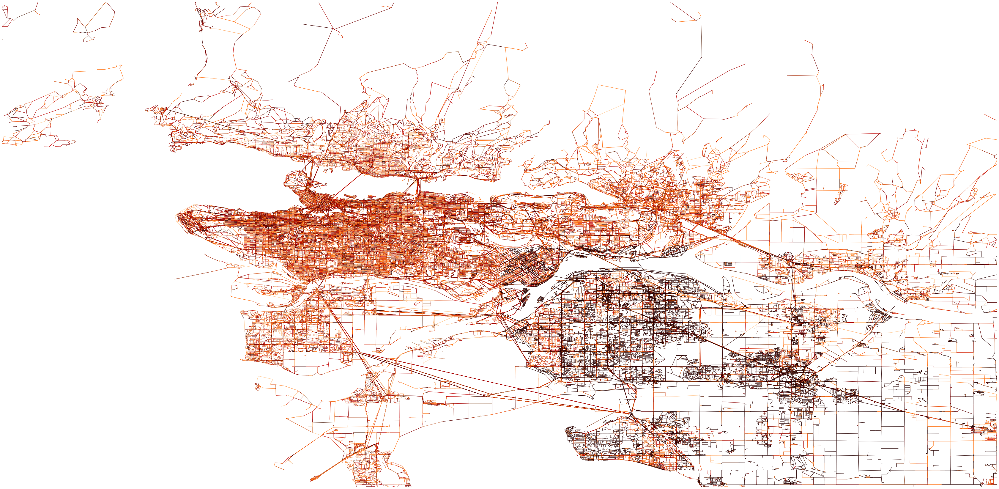

(<Figure size 4320x2160 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f1997b9bc10>)

In [ ]:
edgecolor = ua.plot.col_colors(df=urbanaccess_net.net_edges, col='weight', cmap='gist_heat_r', num_bins=5)
ua.plot.plot_net(nodes=urbanaccess_net.net_nodes,
                 edges=urbanaccess_net.net_edges,
                 bbox=bbox,
                 fig_height=30, margin=0.02,
                 edge_color=edgecolor, edge_linewidth=1, edge_alpha=0.7,
                 node_color='black', node_size=0, node_alpha=1, node_edgecolor='none', node_zorder=3, nodes_only=False)

# **Using UrbanAccess network with Pandana**
Load block data

In [6]:
blocks = pd.read_csv('C:/MDS/Capstone/DSCI_574_spat-temp-mod/DSCI_574_spat-temp-mod_students copy/lectures/Capstone_Data/vancouver_db.csv')
print('Total number of blocks: {:,}'.format(len(blocks)))
blocks.head()

Total number of blocks: 15,197


,id,pop,lat,lon
0,59150004004,35,49.3739,-123.2738
1,59150004005,50,49.3746,-123.2757
2,59150004006,94,49.3738,-123.2763
3,59150004011,0,49.3735,-123.2725
4,59150004012,0,49.3725,-123.2729


In [7]:
lng_max, lat_min, lng_min, lat_max = bbox
outside_bbox = blocks.loc[~(((lng_max < blocks["lon"]) & (blocks["lon"] < lng_min)) & ((lat_min < blocks["lat"]) & (blocks["lat"] < lat_max)))]
blocks_subset = blocks.drop(outside_bbox.index)
print('Total number of subset blocks: {:,}'.format(len(blocks_subset)))

Total number of subset blocks: 15,185


<AxesSubplot:xlabel='lon', ylabel='lat'>

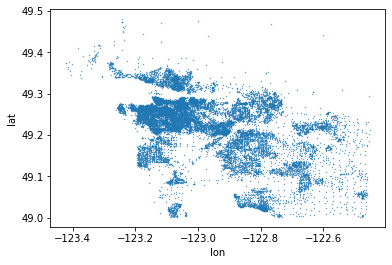

In [7]:
blocks_subset.plot(kind='scatter', x='lon', y='lat', s=0.1)

**Initialize Pandana network**

In [8]:
s_time = time.time()
transit_ped_net = pdna.Network(urbanaccess_net.net_nodes["x"],
                               urbanaccess_net.net_nodes["y"],
                               urbanaccess_net.net_edges["from_int"],
                               urbanaccess_net.net_edges["to_int"],
                               urbanaccess_net.net_edges[["weight"]], 
                               twoway=False)
print('Took {:,.2f} seconds'.format(time.time() - s_time))

Took 32.45 seconds


In [9]:
blocks_subset['node_id'] = transit_ped_net.get_node_ids(blocks_subset['lon'], blocks_subset['lat'])

In [10]:
blocks_subset.head()

,id,pop,lat,lon,node_id
0,59150004004,35,49.3739,-123.2738,80055
1,59150004005,50,49.3746,-123.2757,174210
2,59150004006,94,49.3738,-123.2763,50492
3,59150004011,0,49.3735,-123.2725,93699
4,59150004012,0,49.3725,-123.2729,70462


In [11]:
# calculate cumulative accessibility
transit_ped_net.set(blocks_subset.node_id, name='node_id')

In [ ]:
s_time = time.time()
amens_90 = transit_ped_net.aggregate(90, type='sum', decay='linear', name='node_id')
amens_60 = transit_ped_net.aggregate(60, type='sum', decay='linear', name='node_id')
amens_30 = transit_ped_net.aggregate(30, type='sum', decay='linear', name='node_id')
print('Took {:,.2f} seconds'.format(time.time() - s_time))

Took 3,676.66 seconds


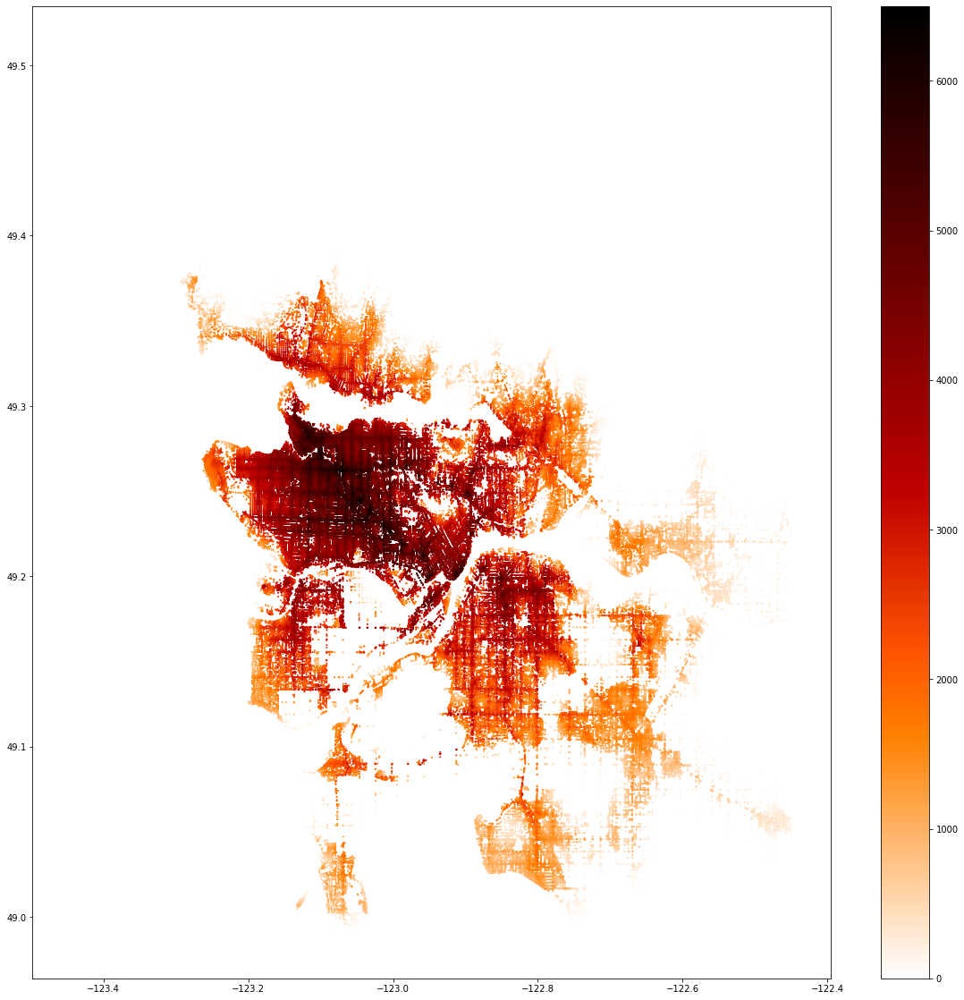

Took 1.47 seconds


In [13]:
# Pleaseeeeeeee...

s_time = time.time()
amens_60 = transit_ped_net.aggregate(60, type='sum', decay='linear', name='node_id')
print('Took {:,.2f} seconds'.format(time.time() - s_time))

s_time = time.time()
transit_ped_net.plot(amens_60, 
                    plot_type='scatter',
                    fig_kwargs={'figsize':[20,20]},
#                     bmap_kwargs={'epsg':'26943','resolution':'h'},
                    plot_kwargs={'cmap':'gist_heat_r','s':4,'edgecolor':'none'})
print('Took {:,.2f} seconds'.format(time.time() - s_time))

**Amenities accessible within 30 minutes**

In [ ]:
s_time = time.time()
transit_ped_net.plot(amens_30, 
                    plot_type='scatter',
                    fig_kwargs={'figsize':[20,20]},
                    bmap_kwargs={'epsg':'26943','resolution':'h'},
                    plot_kwargs={'cmap':'gist_heat_r','s':4,'edgecolor':'none'})
print('Took {:,.2f} seconds'.format(time.time() - s_time))

**Amenities accessible within 60 minutes**

In [ ]:
s_time = time.time()
transit_ped_net.plot(amens_60, 
                    plot_type='scatter',
                    fig_kwargs={'figsize':[20,20]},
                    bmap_kwargs={'epsg':'26943','resolution':'h'},
                    plot_kwargs={'cmap':'gist_heat_r','s':4,'edgecolor':'none'})
print('Took {:,.2f} seconds'.format(time.time() - s_time))

**Amenities accessible within 90 minutes**

In [ ]:
s_time = time.time()
transit_ped_net.plot(amens_90, 
                    plot_type='scatter',
                    fig_kwargs={'figsize':[20,20]},
                    bmap_kwargs={'epsg':'26943','resolution':'h'},
                    plot_kwargs={'cmap':'gist_heat_r','s':4,'edgecolor':'none'})
print('Took {:,.2f} seconds'.format(time.time() - s_time))

# **Configure neareast 10 POIs**

In [31]:
# configure search at a max distance of 10 km for up to the 10 nearest points of interest

types = pois['type'].unique()
distance = 25000
num_pois = 10
num_categories = len(types) + 1

In [32]:
# keyword arguments to pass for the matplotlib figure
# bbox_aspect_ratio = (bbox[2] - bbox[0]) / (bbox[3] - bbox[1])
fig_kwargs = {'facecolor':'w', 
              'figsize':(20, 20)}

# keyword arguments to pass for scatter plots
plot_kwargs = {'s':5, 
               'alpha':0.9, 
               'cmap':'viridis_r', 
               'edgecolor':'none'}

# network aggregation plots are the same as regular scatter plots, but without a reversed colormap
agg_plot_kwargs = plot_kwargs.copy()
agg_plot_kwargs['cmap'] = 'viridis'

# keyword arguments to pass for hex bin plots
hex_plot_kwargs = {'gridsize':60,
                   'alpha':0.9, 
                   'cmap':'viridis_r', 
                   'edgecolor':'none'}

# keyword arguments to pass to make the colorbar
cbar_kwargs = {}

# keyword arguments to pass to basemap
bmap_kwargs = {}

# color to make the background of the axis
bgcolor = 'k'

**Load POIs and network data**

In [9]:
start_time = time.time()

pois = pd.read_csv('C:/MDS/Capstone/DSCI_574_spat-temp-mod/DSCI_574_spat-temp-mod_students copy/lectures/Capstone_Data/vancouver_facilities_2.csv')
method = 'loaded from CSV'
    
print('{:,} POIs {} in {:,.2f} seconds'.format(len(pois), method, time.time()-start_time))
pois['type'].value_counts()

443 POIs loaded from CSV in 0.01 seconds


gallery                                 99
museum                                  92
library or archives                     88
theatre/performance and concert hall    75
artist                                  48
heritage or historic site               28
miscellaneous                            6
art or cultural centre                   5
festival site                            2
Name: type, dtype: int64

In [10]:
import numpy as np
pois = pois.replace('..', np.NaN)
pois = pois.dropna()
pois.count()

id         432
lat        432
lon        432
type       432
name       432
city       432
city_id    432
dtype: int64

In [11]:
pois['node_id'] = transit_ped_net.get_node_ids(pois['lon'], pois['lat'])

In [12]:
pois['node_id'].nunique()

398

In [28]:
pois.head()

,id,lat,lon,type,name,city,city_id,node_id
0,10,49.1763542,-123.112783,museum,12 Service Battalion Museum,Richmond,5915015,117661
1,15,49.261938,-123.151123,museum,15th Field Artillery Regiment Museum And Archives,Vancouver,5915022,24391
2,24,49.278786,-123.098796,museum,221A Artist Run Centre,Vancouver,5915022,177410
3,41,49.2210003,-123.0091848,artist,7302754 Canada Inc,Burnaby,5915025,56486
4,97,49.14709735,-122.6467963,heritage or historic site,Abc Heritage Preschool And Child Care,Langley,5915001,156005


In [13]:
pois_gr = pois.groupby('node_id').size().reset_index()

In [30]:
pois_gr.loc[:,0].sum()

432

In [14]:
transit_ped_net.set(pois_gr.node_id, variable = pois_gr.loc[:,0], name='amens')

In [ ]:
# precomputes the range queries (the reachable nodes within this maximum distance)
transit_ped_net.precompute(distance + 1)

In [17]:
# initialize the underlying points of interest engine
transit_ped_net.init_pois(num_categories=num_categories, max_dist=distance, max_pois=num_pois)

In [18]:
# initialize a category for all amenities with the locations specified by the lon and lat columns
transit_ped_net.set_pois(category='all', x_col=pois['lon'], y_col=pois['lat'])

Reading parameters from init_pois()
Reading parameters from init_pois()


In [ ]:
# searches for the n nearest amenities (of all types) to each node in the network
all_access = transit_ped_net.nearest_pois(distance=distance, category='all', num_pois=num_pois)

print('{:,} nodes'.format(len(all_access)))
all_access.head()

**Facilities accessible within 120 minutes**

In [ ]:
s_time = time.time()
facilities_120 = transit_ped_net.aggregate(120, type='sum', decay='linear', name='amens')
print('Took {:,.2f} seconds'.format(time.time() - s_time))

In [ ]:
s_time = time.time()
transit_ped_net.plot(facilities_120, 
                    plot_type='scatter',
                    fig_kwargs={'figsize':[20,20]},
                    bmap_kwargs={'epsg':'4141','resolution':'h'},
                    plot_kwargs={'cmap':'gist_heat_r','s':4,'edgecolor':'none'})
print('Took {:,.2f} seconds'.format(time.time() - s_time))

In [ ]:
s_time = time.time()
facilities_120 = transit_ped_net.aggregate(120, type='sum', decay='linear', name='amens')
print('Took {:,.2f} seconds'.format(time.time() - s_time))

s_time = time.time()
transit_ped_net.plot(facilities_120, 
                    plot_type='scatter',
                    fig_kwargs={'figsize':[20,20]},
                    # bmap_kwargs={'epsg':'4141','resolution':'h'},
                    plot_kwargs={'cmap':'gist_heat_r','s':4,'edgecolor':'none'})
print('Took {:,.2f} seconds'.format(time.time() - s_time))

Plot accessibility from each node to any amenity

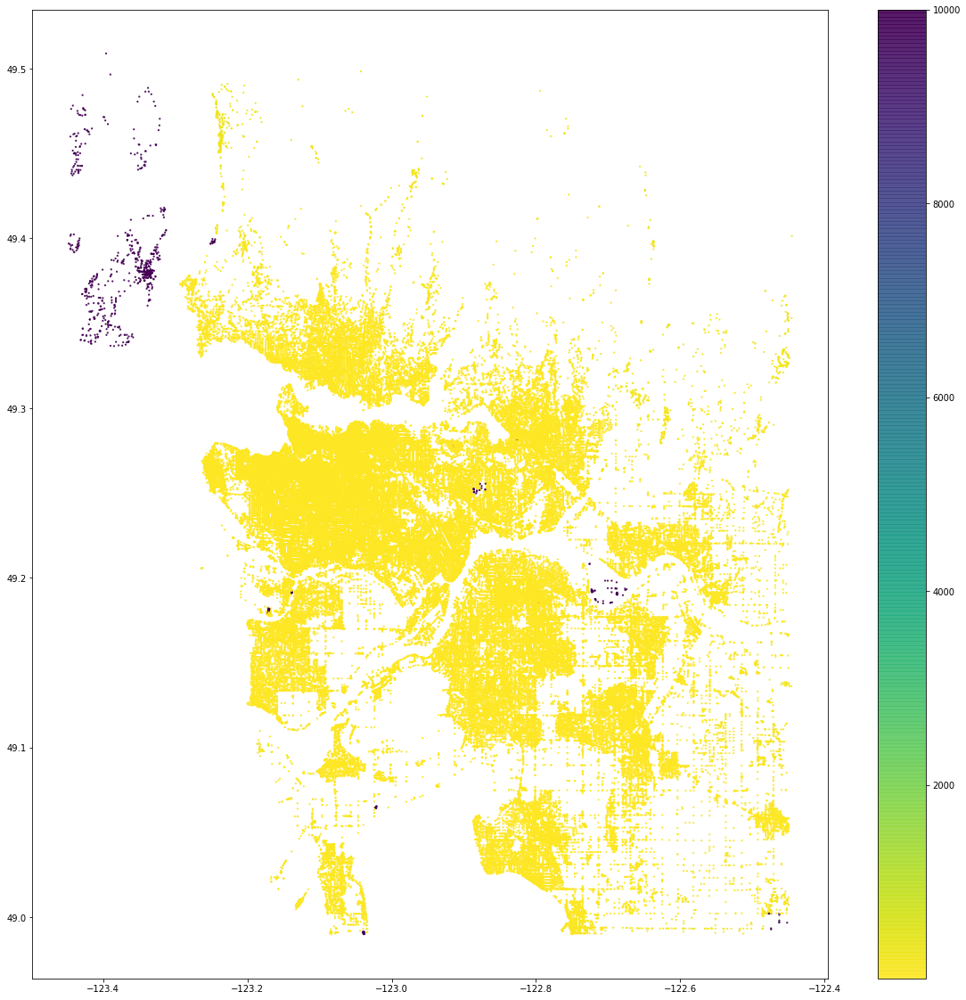

(<Figure size 1440x1440 with 2 Axes>, <AxesSubplot:>)

In [28]:
# distance to the nearest amenity of any type
n = 10
transit_ped_net.plot(all_access[n], bbox=bbox, plot_kwargs=plot_kwargs, fig_kwargs=fig_kwargs, 
                                     cbar_kwargs=cbar_kwargs)
# ax.set_axis_bgcolor(bgcolor)
# ax.set_title('Travel Time (min) to nearest amenity around Vancouver', fontsize=15)
# fig.savefig('images/accessibility-all-east-bay.png', dpi=200, bbox_inches='tight')

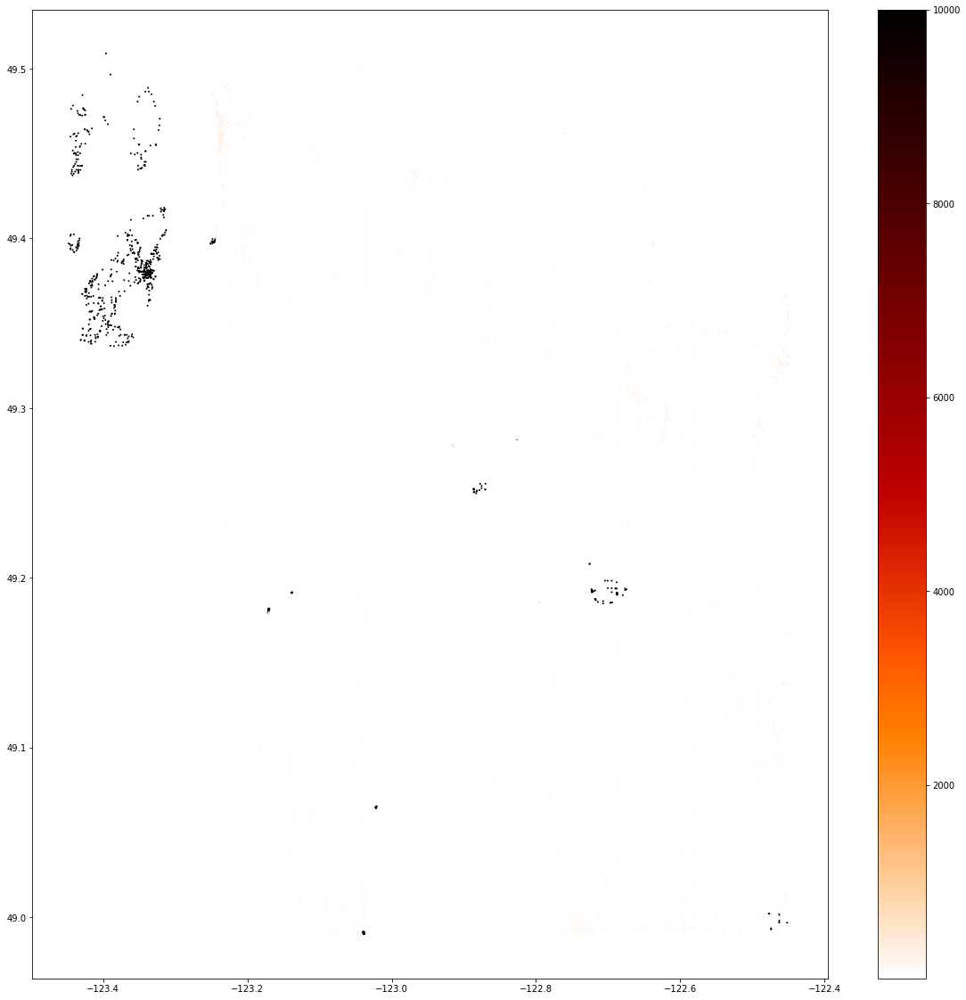

(<Figure size 1440x1440 with 2 Axes>, <AxesSubplot:>)

In [30]:
# distance to the nearest amenity of any type
n = 10
transit_ped_net.plot(all_access[n], plot_type='scatter',
                    fig_kwargs={'figsize':[20,20]},
                    plot_kwargs={'cmap':'gist_heat_r','s':4,'edgecolor':'none'})